# Libraries

In [3]:
# Data Handling
import pandas as pd
import numpy as np

# Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import ADASYN

# Model Evaluation
from sklearn.metrics import r2_score, accuracy_score, mean_squared_error

# Matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
from highlight_text import fig_text
import matplotlib.patheffects as path_effects

from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import gaussian_filter
# mplsoccer imports
from matplotlib.colors import ListedColormap
from mplsoccer import (VerticalPitch, Pitch, create_transparent_cmap,
                       FontManager, arrowhead_marker, Sbopen, add_image)
from PIL import Image
from urllib.request import urlopen

fm_rubik = FontManager('https://raw.githubusercontent.com/google/fonts/main/ofl/'
                       'rubikmonoone/RubikMonoOne-Regular.ttf')

# ML
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
## GridSearchCV
from sklearn.model_selection import GridSearchCV

# PyTorch
import torch
## Dataloader
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
## Layers
from torch.nn import Module, Linear, ReLU, LeakyReLU
## Loss
from torch.nn import MSELoss
## Optimizer
from torch.optim import Adam, SGD

# Data Preprocessing 

In [276]:
def preprocessing(df, num_rows = 50000):

    print("\x1b[32mStarting preprocessing...\x1b[31m")
    
    df = df[["X", "Y", "xG", "minute", "h_a", "situation", "shotType", "lastAction", "result"]]
    df = df[df["lastAction"].isnull() == False].reset_index(drop =True).copy()
    df = df.drop(df[df["result"]=="OwnGoal"].index)
    remapping = {"Goal": 1, 
             "MissedShots": 0, 
             "SavedShot": 0, 
             "BlockedShot": 0, 
             "ShotOnPost": 0, 
             }

    lastAction = {"Cross": ["Aerial", "Cross", "Chipped"] , 
                  "Pass":["Pass", "Throughball", "HeadPass", "BallTouch", "TakeOn"],
                  "Dispossessed":["Dispossessed", "Tackle", "BlockedPass",
                                  "Interception", "Challenge", "Clearance", "BallRecovery"],
                  "Other":["Standard", "Rebound", "LayOff", "CornerAwarded", 
                           "Foul", "Goal", "End", "OffsidePass", 
                  "GoodSkill", "Card", "SubstitutionOn", "OffsideProvoked",
                           "Save", "KeeperPickup", 
                  "FormationChange", "Start", "ChanceMissed", "ShieldBallOpp"]}

    print("Remapping target column")
    df["result"] = df["result"].map(remapping)
    
    print("Remapping lastAction column")
    for k, v in lastAction.items():
        for i in v:
            df["lastAction"].replace(to_replace = i, value = k, inplace = True)

    print("One hot encoding remaining columns")
    df_encoded = pd.get_dummies(df, 
                                drop_first = True)
    if num_rows != None:
        print(f"Using only {num_rows} rows")
        df_encoded = df_encoded.loc[:num_rows, :]
    else:
        print(f"Using all rows")

    print("Preprocessing done\x1b[0m")
    return df_encoded

In [278]:
df2 = pd.read_csv("player_stats.csv")

df3 = df2.copy()

print("Before filtering, df shape", df3.shape)

df3 = df3[df3['situation'] != 'Penalty']

df3_grouped = df3.groupby(["player", "result"]).size()
df3['shot_count'] = df3.groupby('player')['player'].transform('size')
df4 = df3.groupby(["player", 'shot_count', "result"])[['shot_count']].count()
df4 = df4.rename(columns = {'shot_count':'count'})
df5 = df4.sort_values(by = df4.index.names[1], ascending = False)
df5["result"] = df5.index.get_level_values(2)
df5.index = df5.index.droplevel(2)
df5['shot_count'] = df5.index.get_level_values(1)
df5.index= df5.index.droplevel(1)
df5 = df5[df5['shot_count']>40]
df3 = df3[df3["player"].isin(df5.index)]
print("After filtering, df shape", df3.shape)

df_encoded = preprocessing(df3, num_rows = None)

X = df_encoded.drop(["xG"], axis = 1).copy()
Y = df_encoded["xG"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size = 0.8)
scaler = StandardScaler()
scaler.fit(X_train[["minute"]])
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()
X_train_scaled["minute"] = scaler.transform(X_train[["minute"]])
X_test_scaled["minute"] = scaler.transform(X_test[["minute"]])




Before filtering, df shape (111031, 20)
After filtering, df shape (105977, 21)
Starting preprocessing...
Remapping target column
Remapping lastAction column
One hot encoding remaining columns
Using all rows
Preprocessing done


In [279]:
X_test_scaled

,X,Y,minute,result,h_a_h,situation_FromCorner,situation_OpenPlay,situation_SetPiece,shotType_LeftFoot,shotType_OtherBodyPart,shotType_RightFoot,lastAction_Dispossessed,lastAction_Other,lastAction_Pass
22126,0.906,0.666,-0.112928,0,True,False,True,False,False,False,True,False,False,True
81947,0.916,0.550,-0.528972,0,True,False,True,False,True,False,False,False,False,True
81213,0.875,0.618,0.794805,0,True,False,True,False,False,False,True,False,False,True
24924,0.906,0.536,0.151827,0,True,False,True,False,False,False,False,False,False,False
18683,0.912,0.338,-0.604617,0,False,False,True,False,True,False,False,False,False,True
39421,0.949,0.528,1.551249,0,False,False,True,False,False,False,False,False,False,False
66007,0.949,0.445,-0.982839,0,True,False,True,False,False,False,True,False,False,True
35528,0.822,0.444,-0.264217,0,True,False,True,False,False,False,True,False,False,True
40098,0.899,0.640,-0.945016,0,True,False,True,False,True,False,False,False,False,False
5423,0.751,0.503,0.567872,0,True,False,True,False,True,False,False,False,False,True


In [280]:
class CustomDataset(Dataset):
    def __init__(self, features, target):
        super().__init__()
        self.features = torch.from_numpy(features.astype(np.float32))
        self.target = torch.from_numpy(target.astype(np.float32))

    def __len__(self):
        return len(self.target)

    def __getitem__(self, idx):
        target = self.target[idx]
        features = self.features[idx]
        return features, target

# Model 1

In [294]:
class Model_1(Module):
    def __init__(self):
        super().__init__()
        self.input_dim = 14
        self.hidden_dim_1 = 128
        self.hidden_dim_2 = 256
        self.hidden_dim_3 = 512
        self.hidden_dim_4 = 256
        self.hidden_dim_5 = 128
        self.output_dim = 1
        self.linear_relu_stack = torch.nn.Sequential(
            Linear(in_features = self.input_dim, out_features = self.hidden_dim_1),
            LeakyReLU(),
            Linear(in_features = self.hidden_dim_1, out_features = self.hidden_dim_2),
            LeakyReLU(),
            Linear(in_features = self.hidden_dim_2, out_features = self.hidden_dim_3),
            LeakyReLU(),
            Linear(in_features = self.hidden_dim_3, out_features = self.hidden_dim_4),
            LeakyReLU(),
            Linear(in_features = self.hidden_dim_4, out_features = self.hidden_dim_5),
            LeakyReLU(),
            Linear(in_features = self.hidden_dim_5, out_features = self.output_dim)
        )
        
    def forward(self, x):
        logits = self.linear_relu_stack(x)
        return logits

## Train Function for ANN

In [286]:
def train(model, criterion, optimizer, train_dl):

    num_epochs = 50
    loss_arr = []
    
    model.train()
    
    for epoch in range(num_epochs):
        epoch_loss = 0
        batch_counter = 0
        epoch_preds = list()
        epoch_trues = list()
        for X, y in train_dl:
            preds = model(X)
            
            loss = criterion(preds, y.unsqueeze(dim = 1))
            batch_counter += 1
            epoch_loss += loss.item()
            
            epoch_preds.append(preds)
            epoch_trues.append(y)
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        loss_arr.append(loss.item())
        acc = r2_score(torch.cat(epoch_trues, 0).detach().numpy(),
                      torch.cat(epoch_preds, 0).detach().numpy())
        print(f"Epoch {epoch+1}| Training loss: {epoch_loss/(batch_counter * 64)}| Training Acc: {acc}")
    return loss_arr

## Test Function for ANN

In [287]:
def test(model, test_dl):

    model.eval()
    epoch_preds = list()
    epoch_trues = list()
    with torch.no_grad():
        epoch_preds = list()
        epoch_trues = list()
        for X, y in test_dl:
            preds = model(X)
    
            epoch_trues.append(y)
            epoch_preds.append(preds)
    
    acc = r2_score(torch.cat(epoch_trues, 0).detach().numpy(),
                  torch.cat(epoch_preds, 0).detach().numpy())
    print(f"Test Accuracy {acc}")

    return epoch_trues, epoch_preds

## Without minute column

In [288]:
train_data = CustomDataset(X_train.values, y_train.values)
test_data = CustomDataset(X_test.values, y_test.values)
train_dl = DataLoader(dataset = train_data, batch_size = 64, shuffle = True)
test_dl = DataLoader(dataset = test_data, batch_size = 64, shuffle = True)
model_1 = Model_1()
criterion = MSELoss()
optimizer = Adam(model_1.parameters(), lr = 0.0001)
loss = train(model_1, criterion, optimizer, train_dl)
epoch_trues, epoch_preds = test(model_1, test_dl)

Epoch 1| Training loss: 0.0003650723038215871| Training Acc: 0.1457251742352803
Epoch 2| Training loss: 0.0003268138626344164| Training Acc: 0.23546735744245806
Epoch 3| Training loss: 0.00031697067829672106| Training Acc: 0.25829475501880395
Epoch 4| Training loss: 0.00030516876054461077| Training Acc: 0.28598122425718464
Epoch 5| Training loss: 0.0002920923318415256| Training Acc: 0.3165616188860628
Epoch 6| Training loss: 0.0002810155356799246| Training Acc: 0.3426237720964974
Epoch 7| Training loss: 0.00026874442780712194| Training Acc: 0.3712698639582579
Epoch 8| Training loss: 0.00025850800639780304| Training Acc: 0.3952146938437059
Epoch 9| Training loss: 0.0002548757152691783| Training Acc: 0.4035646675603427
Epoch 10| Training loss: 0.0002457925986435007| Training Acc: 0.42510396126409067
Epoch 11| Training loss: 0.00025060698910652976| Training Acc: 0.41369230467325113
Epoch 12| Training loss: 0.00024353930247730639| Training Acc: 0.43023786616838433
Epoch 13| Training loss: 

## With minute column

In [295]:
train_data = CustomDataset(X_train_scaled.values, y_train.values)
test_data = CustomDataset(X_test_scaled.values, y_test.values)
train_dl = DataLoader(dataset = train_data, batch_size = 64, shuffle = True)
test_dl = DataLoader(dataset = test_data, batch_size = 64, shuffle = True)
model_1 = Model_1()
criterion = MSELoss()
optimizer = Adam(model_1.parameters(), lr = 0.0001)
min_loss = train(model_1, criterion, optimizer, train_dl)
epoch_trues, epoch_preds = test(model_1, test_dl)

Epoch 1| Training loss: 0.00028321290248685085| Training Acc: 0.33738603608005946
Epoch 2| Training loss: 0.00021344916888428437| Training Acc: 0.5006024210913216
Epoch 3| Training loss: 0.00018239345800800488| Training Acc: 0.5732158646817453
Epoch 4| Training loss: 0.0001664576860083958| Training Acc: 0.6105628767190856
Epoch 5| Training loss: 0.0001589770839955213| Training Acc: 0.628165400341221
Epoch 6| Training loss: 0.00015319468733647837| Training Acc: 0.6415533522714978
Epoch 7| Training loss: 0.0001499588603151062| Training Acc: 0.6491957007635482
Epoch 8| Training loss: 0.00014680802852398226| Training Acc: 0.656454040137926
Epoch 9| Training loss: 0.00014690326260173846| Training Acc: 0.6562243878026419
Epoch 10| Training loss: 0.0001441877011393558| Training Acc: 0.6625912522654298
Epoch 11| Training loss: 0.00014322512890232108| Training Acc: 0.6648323684569779
Epoch 12| Training loss: 0.00014168116829752457| Training Acc: 0.6684413288849238
Epoch 13| Training loss: 0.000

## Plot for Loss

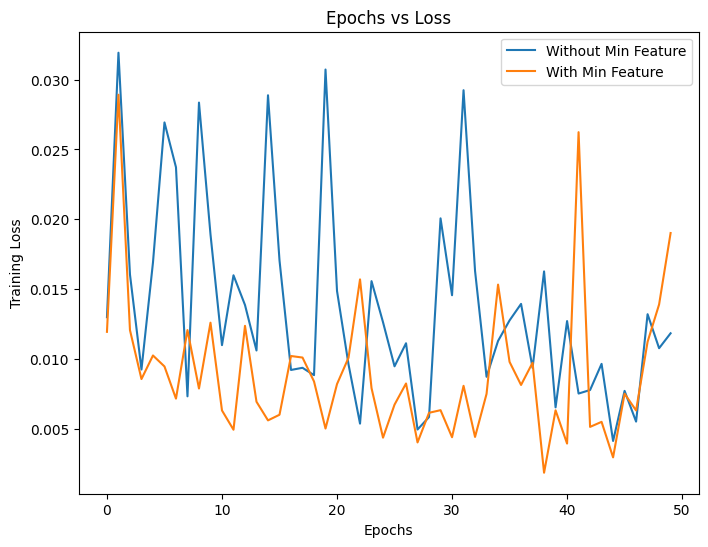

In [174]:
plt.figure(figsize = (8,6))
plt.plot(loss, label = 'Without Min Feature')
plt.plot(min_loss, label = 'With Min Feature')
plt.xlabel("Epochs")
plt.ylabel("Training Loss")
plt.title("Epochs vs Loss")
plt.legend()

# Machine Learning
## Models being considered

* Lasso Regression
* Ridge Regression
* ElasticNet Regression
* Random Forest
* KNN

Using GridSearchCV and Pipeline to find the best model

In [296]:
pipe = Pipeline([("classifier", LinearRegression())])

param_grid = [
    {
        'classifier': [Lasso(random_state = 42)],
        'classifier__alpha': [0.01, 0.1, 1],
        'classifier__max_iter': [1, 5, 10],
        'classifier__selection': ['cyclic', 'random']
    },
    {
        'classifier': [Ridge(random_state = 42)],
        'classifier__alpha':[0.01, 0.1, 1],
        'classifier__max_iter': [1, 5, 10],
        'classifier__solver': ['saga', 'lbfgs'],
    },
    {
        'classifier': [ElasticNet(random_state = 42)],
        'classifier__alpha': [0.01, 0.1, 1],
        'classifier__max_iter': [1, 5, 10],
        'classifier__selection': ['cyclic', 'random']
    },
    {
        'classifier': [RandomForestRegressor(random_state = 42)],
        'classifier__n_estimators': [5, 10, 20, 50],
        'classifier__max_depth': [5, 10, 20, 30, 40, 50],
        'classifier__min_samples_split': [2, 5, 20],
    },
    {
        'classifier': [KNeighborsRegressor()],
        'classifier__n_neighbors': [3, 4, 5, 7],
        'classifier__metric': ['minkowski', 'manhattan', 'euclidean']
    }
]

bs = GridSearchCV(pipe, param_grid, cv = 5, verbose = 3)
bs.fit(X_train, y_train)



Fitting 5 folds for each of 138 candidates, totalling 690 fits
[CV 1/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.183 total time=   0.0s
[CV 2/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.183 total time=   0.1s
[CV 3/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.183 total time=   0.1s
[CV 4/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.184 total time=   0.1s
[CV 5/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.177 total time=   0.1s
[CV 1/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=random;, score=0.183 total ti

/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
45 fits failed out of a total of 690.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/pipeline.py", line 420, in fit
    self._

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('classifier', LinearRegression())]),
             param_grid=[{'classifier': [Lasso(random_state=42)],
                          'classifier__alpha': [0.01, 0.1, 1],
                          'classifier__max_iter': [1, 5, 10],
                          'classifier__selection': ['cyclic', 'random']},
                         {'classifier': [Ridge(random_state=42)],
                          'classifier__alpha': [0.01, 0.1, 1],
                          'classifier__max_iter': [1, 5, 10],
                          'clas...
                         {'classifier': [RandomForestRegressor(max_depth=20,
                                                               min_samples_split=20,
                                                               n_estimators=50,
                                                               random_state=42)],
                          'classifier__max_depth': [5, 10, 20, 30, 40, 50],
                          'classifier__min_samples_split': [2, 5, 20],
                          'classifier__n_estimators': [5, 10, 20, 50]},
                         {'classifier': [KNeighborsRegressor()],
                          'classifier__metric': ['minkowski', 'manhattan',
                                                 'euclidean'],
                          'classifier__n_neighbors': [3, 4, 5, 7]}],
             verbose=3)

## Best Model from GridSearchCV

In [297]:
bs.best_params_

{'classifier': RandomForestRegressor(max_depth=20, min_samples_split=20, n_estimators=50,
                       random_state=42),
 'classifier__max_depth': 20,
 'classifier__min_samples_split': 20,
 'classifier__n_estimators': 50}

### Accuracy

In [298]:
prediction = bs.predict(X_test)
accuracy = r2_score(y_test, prediction)

In [299]:
accuracy

0.6911633590164322

### Mean Squared Error

In [305]:
mse = mean_squared_error(y_test, prediction)
mse

0.008593245904292243

## Resampled Data (adding minute column)

In [300]:
bs = GridSearchCV(pipe, param_grid, cv = 5, verbose = 3)
bs.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 138 candidates, totalling 690 fits
[CV 1/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.182 total time=   0.0s
[CV 2/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.182 total time=   0.1s
[CV 3/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.183 total time=   0.1s
[CV 4/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.184 total time=   0.1s
[CV 5/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=cyclic;, score=0.176 total time=   0.2s
[CV 1/5] END classifier=Lasso(random_state=42), classifier__alpha=0.01, classifier__max_iter=1, classifier__selection=random;, score=0.182 total ti

/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
45 fits failed out of a total of 690.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/ChiragSP/Library/Python/3.9/lib/python/site-packages/sklearn/pipeline.py", line 420, in fit
    self._

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('classifier', LinearRegression())]),
             param_grid=[{'classifier': [Lasso(random_state=42)],
                          'classifier__alpha': [0.01, 0.1, 1],
                          'classifier__max_iter': [1, 5, 10],
                          'classifier__selection': ['cyclic', 'random']},
                         {'classifier': [Ridge(random_state=42)],
                          'classifier__alpha': [0.01, 0.1, 1],
                          'classifier__max_iter': [1, 5, 10],
                          'clas...
                         {'classifier': [RandomForestRegressor(max_depth=20,
                                                               min_samples_split=20,
                                                               n_estimators=50,
                                                               random_state=42)],
                          'classifier__max_depth': [5, 10, 20, 30, 40, 50],
                          'classifier__min_samples_split': [2, 5, 20],
                          'classifier__n_estimators': [5, 10, 20, 50]},
                         {'classifier': [KNeighborsRegressor()],
                          'classifier__metric': ['minkowski', 'manhattan',
                                                 'euclidean'],
                          'classifier__n_neighbors': [3, 4, 5, 7]}],
             verbose=3)

In [301]:
bs.best_params_

{'classifier': RandomForestRegressor(max_depth=20, min_samples_split=20, n_estimators=50,
                       random_state=42),
 'classifier__max_depth': 20,
 'classifier__min_samples_split': 20,
 'classifier__n_estimators': 50}

### Accuracy (with minute column added)

In [302]:
prediction_scaled = bs.predict(X_test_scaled)
accuracy = r2_score(y_test, prediction_scaled)
accuracy

0.6911328861428512

### Mean Squared Error

In [303]:
mse = mean_squared_error(y_test, prediction_scaled)

In [304]:
mse

0.008594093798814272

## GridSearch Plotting

In [240]:
cv_df = pd.DataFrame(bs.cv_results_)

<Figure size 1000x2000 with 0 Axes>

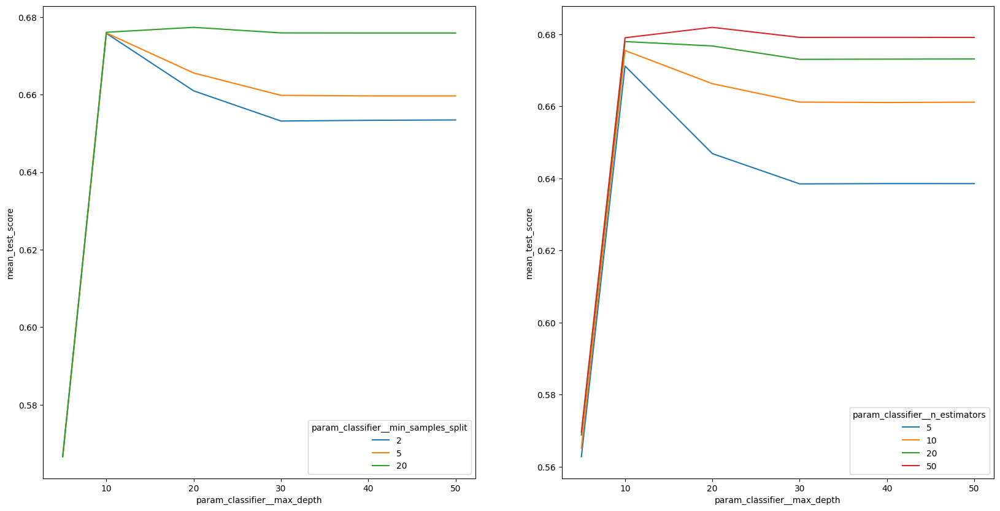

In [166]:

# Extracting relevant columns for plotting
relevant_columns = ['param_classifier__max_depth', 
                    'param_classifier__min_samples_split',
                    'param_classifier__n_estimators', 'mean_test_score']
cv_df = cv_df[relevant_columns]

grouped_models = cv_df.groupby(['param_classifier__max_depth']).mean()
grouped_models

plt.figure(figsize=(10, 20))  # Adjust figure size as needed


# Subplots
fig, axes = plt.subplots(1, 2, figsize = (20, 10))

sns.lineplot(data=cv_df, x="param_classifier__max_depth", y="mean_test_score",
             hue="param_classifier__min_samples_split", palette = 'tab10', errorbar = None, ax = axes[0])
sns.lineplot(data=cv_df, x="param_classifier__max_depth", y="mean_test_score", hue="param_classifier__n_estimators", palette = 'tab10', errorbar = None, ax = axes[1], legend = 'full')


# Show plot
plt.show()


# Heatmap for Plotting the xG values on the Soccer Pitch

## Plotting the Predicted xG values

In [180]:
concatenated_pred = torch.cat(epoch_preds, 0)
concatenated_trues = torch.cat(epoch_trues, 0)

In [238]:
pred_np = concatenated_pred.detach().numpy()

# Create DataFrame for predicted values
pred_df = pd.DataFrame(pred_np, columns=["Predicted"],
                       index=pd.DataFrame(X_test).index)

pred_heatmap = pd.concat([pd.DataFrame(X_test), pred_df], axis=1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,Predicted
0,0.840,0.598,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.115120
1,0.856,0.523,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.118796
2,0.811,0.461,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.065875
3,0.809,0.479,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.056928
4,0.950,0.509,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.487059


<Figure size 30720x23040 with 0 Axes>

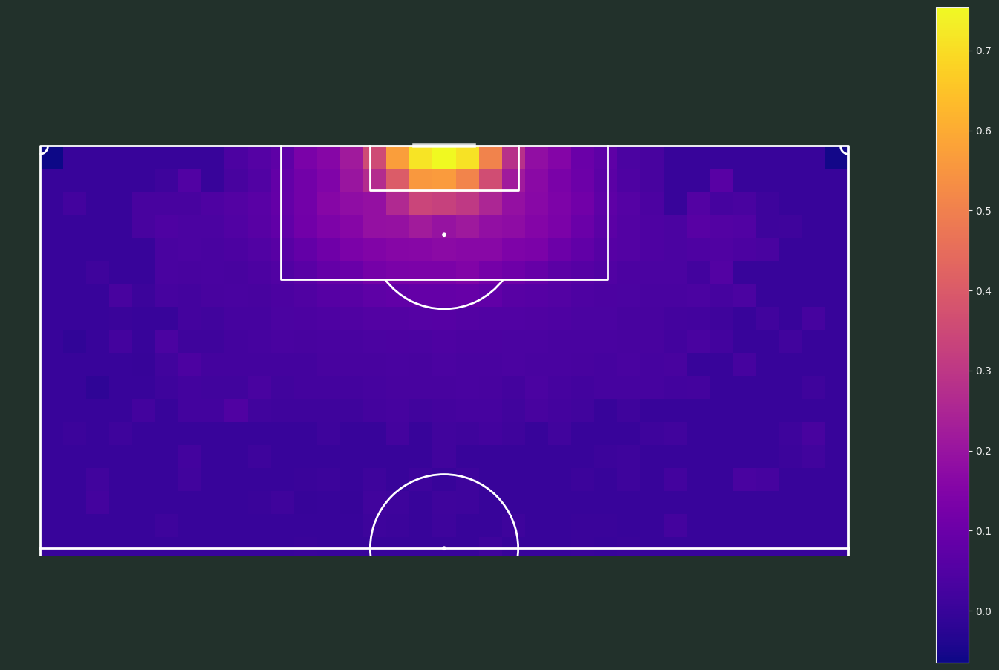

In [239]:

# Define a lambda function to calculate mean with NaN replaced by 0
mean_with_zero = lambda x: np.nanmean(x) if not np.isnan(np.nanmean(x)) else 0

plt.figure(dpi=4800) 
path_eff = [path_effects.Stroke(linewidth=0.5, foreground='black'),
            path_effects.Normal()]
pitch = VerticalPitch(pad_bottom=1, half=True, goal_type='line',
                      corner_arcs=True, goal_alpha=0.8,
                      pitch_type='custom', pitch_length=99.5,
                      pitch_width=100,
                      line_zorder=2, line_color='white',
                      pitch_color='#22312b')

fig, ax = pitch.draw(figsize=(15, 15))
fig.set_facecolor('#22312b')

# Calculating bin statistics with mean calculated using the lambda function
bin_statistic = pitch.bin_statistic(pred_heatmap.iloc[:, 0] * 100,
                                    pred_heatmap.iloc[:, 1] * 100, 
                                    values=pred_heatmap.Predicted,
                                    statistic= mean_with_zero,
                                    bins=(35, 35))

# Apply Gaussian filter
bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], -100)

pcm = pitch.heatmap(bin_statistic, ax=ax, cmap='plasma')
cbar = fig.colorbar(pcm, ax=ax, shrink=0.6)

cbar.outline.set_edgecolor('#efefef')
cbar.ax.yaxis.set_tick_params(color='#efefef')

ticks = plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='#efefef')

## Plotting the Actual xG values

In [264]:
trues_np = concatenated_trues.detach().numpy()

# Create DataFrame for predicted values
trues_df = pd.DataFrame(trues_np, columns=["Predicted"], index=pd.DataFrame(X_test).index)

trues_heatmap = pd.concat([pd.DataFrame(X_test), trues_df], axis=1)

In [265]:
trues_heatmap.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,Predicted
0,0.840,0.598,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.082458
1,0.856,0.523,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.143689
2,0.811,0.461,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.066431
3,0.809,0.479,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.030567
4,0.950,0.509,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.136220


<Figure size 30720x23040 with 0 Axes>

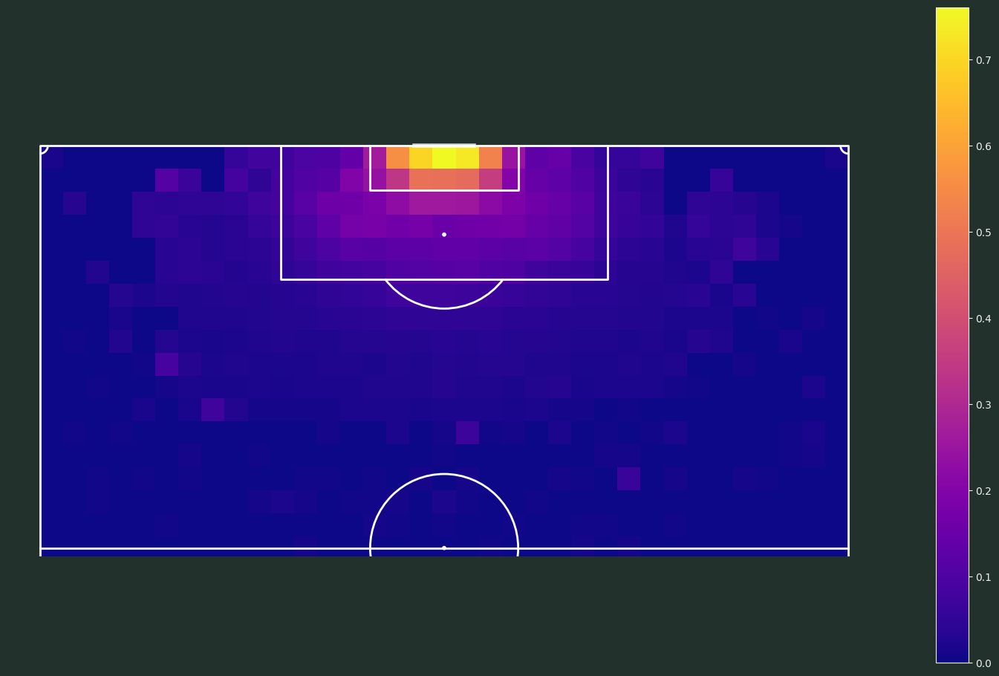

In [266]:
plt.figure(dpi=4800) 
path_eff = [path_effects.Stroke(linewidth=0.5, foreground='black'),
            path_effects.Normal()]
pitch = VerticalPitch(pad_bottom = 1, half = True, goal_type = 'line',
                      corner_arcs = True, goal_alpha = 0.8, pitch_type = 'custom',
                      pitch_length = 99.5, pitch_width = 100, line_zorder=2,
                      line_color='white', pitch_color='#22312b')
mean_with_zero = lambda x: np.nanmean(x) if not np.isnan(np.nanmean(x)) else 0

fig, ax = pitch.draw(figsize=(15,15))
fig.set_facecolor('#22312b')

bin_statistic = pitch.bin_statistic(trues_heatmap.iloc[:, 0] * 100,
                                    trues_heatmap.iloc[:, 1]* 100, 
                                    values = trues_heatmap.Predicted,
                                    statistic=mean_with_zero, bins=(35, 35))

bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], -100)

pcm = pitch.heatmap(bin_statistic, ax=ax, cmap='plasma')
cbar = fig.colorbar(pcm, ax=ax, shrink=0.6)

cbar.outline.set_edgecolor('#efefef')
cbar.ax.yaxis.set_tick_params(color='#efefef')

ticks = plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='#efefef')


# Plotting Player Shotmap to understand the Data

In [9]:
df = pd.read_csv("player_stats.csv")
df_goal = df[((df.a_team == 'Manchester City') | (df.h_team == 'Manchester City')) & (df.result == 'Goal') & (df.player == 'Erling Haaland')]
df_no_goal = df[((df.a_team == 'Manchester City') | (df.h_team == 'Manchester City')) & (df.result != 'Goal') & (df.player == 'Erling Haaland')]

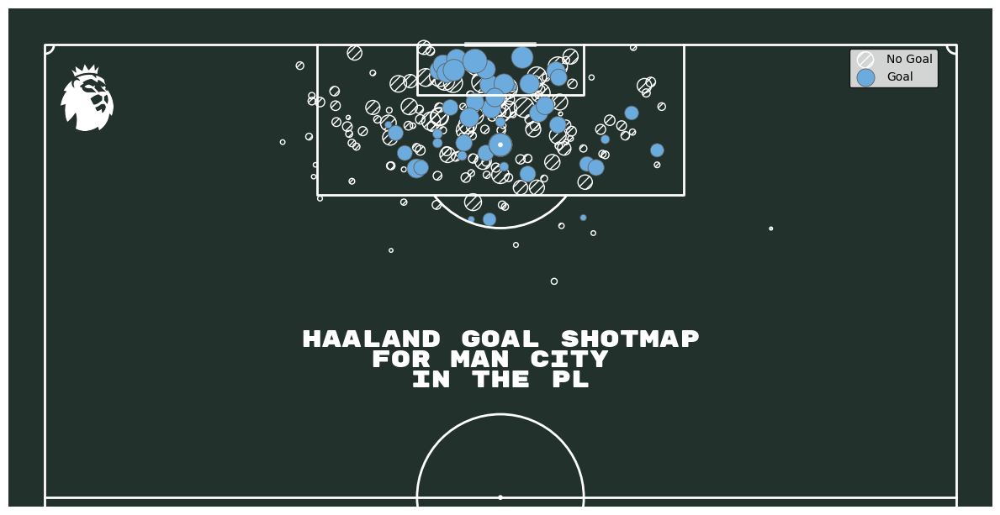

In [16]:
from mplsoccer import add_image, VerticalPitch, FontManager

# plt.figure(dpi=20000) 

pitch = VerticalPitch(pad_bottom=1, half=True, goal_type='line',
                      corner_arcs=True, goal_alpha=0.8,
                      pitch_type='custom', pitch_length=99.5, pitch_width=100,
                      line_zorder=2, line_color='white', pitch_color='#22312b')
fig, ax = pitch.draw(figsize=(12, 10))

# Plot non-goal shots with hatch
sc1 = pitch.scatter(df_no_goal.X * 100, df_no_goal.Y * 100,
                    s=(df_no_goal.xG * 500),
                    edgecolors='white',
                    c='None',
                    hatch='///',
                    marker='o',
                    ax=ax, label='No Goal')

# Plot goal shots with a football marker
sc2 = pitch.scatter(df_goal.X * 100, df_goal.Y * 100,
                    s=(df_goal.xG * 500),
                    edgecolors='#606060',
                    linewidths=0.6,
                    c='#6CABDD',
                    ax=ax, label='Goal')

# Add legend using LegendHandler
ax.legend(edgecolor='black', fontsize=10, handlelength=2, bbox_to_anchor=(0.95, 0.93),
          facecolor='white')


txt = ax.text(x=50, y=65, s='Haaland Goal ShotMap\nfor Man City \nin the PL',
              size=20, fontproperties=fm_rubik.prop, color=pitch.line_color,
              va='center', ha='center')

epl = Image.open(
    urlopen("https://raw.githubusercontent.com/andrewRowlinson/mplsoccer-assets/main/epl.png")
)
fig = add_image(epl, fig, 0.05, 0.65, 0.08, 0.08)


# End